## Exploratory Data Analysis

In [2]:
import pandas as pd
import numpy as np
import sklearn
import string
import nltk
from nltk.corpus import stopwords
from nltk import word_tokenize
from nltk.stem import WordNetLemmatizer
from nltk.stem import PorterStemmer
from nltk.tokenize import RegexpTokenizer
from nltk.probability import FreqDist
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud

%matplotlib inline

In [3]:
df = pd.read_csv('clean_critics.csv', engine='python')

In [15]:
df = df[df['clean_review'].notna()]


In [16]:
df = df.drop(columns = 'Unnamed: 0')

In [17]:
df.head()

,title,artist,label,release_date,metascore,user_score,genre,summary,name,date,...,clean_review,length,word_count,sentiment,negative,neutral,positive,sent_class,rating_sent,sp_lm
0,The Wanting,Glenn Jones,Thrill Jockey,2011-09-13,77.0,tbd,Adult Alternative,The fourth solo acoustic album for the guitari...,Mojo,2011-09-27,...,best dreams oct p,103.0,8.0,0.7845,0.000,0.225,0.775,1.0,1.0,good dream oct p
1,The Wanting,Glenn Jones,Thrill Jockey,2011-09-13,77.0,tbd,Adult Alternative,The fourth solo acoustic album for the guitari...,Boston Globe,2011-09-22,...,jones furthers exploratory path hes committed ...,351.0,43.0,0.9274,0.078,0.493,0.428,1.0,1.0,jones further exploratory path s commit tran...
2,The Wanting,Glenn Jones,Thrill Jockey,2011-09-13,77.0,tbd,Adult Alternative,The fourth solo acoustic album for the guitari...,AllMusic,2011-09-22,...,jones performances compositions years touched ...,372.0,56.0,0.4767,0.000,0.812,0.188,1.0,1.0,jones performances composition year touch them...
3,The Wanting,Glenn Jones,Thrill Jockey,2011-09-13,77.0,tbd,Adult Alternative,The fourth solo acoustic album for the guitari...,Drowned In Sound,2011-09-22,...,wanting boasts technical excellence cosy welco...,197.0,20.0,0.8932,0.000,0.457,0.543,1.0,1.0,want boast technical excellence cosy welcoming...
4,The Wanting,Glenn Jones,Thrill Jockey,2011-09-13,77.0,tbd,Adult Alternative,The fourth solo acoustic album for the guitari...,PopMatters,2011-09-22,...,makes space creates landscape invites,151.0,17.0,0.2732,0.000,0.656,0.344,1.0,1.0,make space create landscape invite


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 110897 entries, 0 to 110896
Data columns (total 23 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   Unnamed: 0    110897 non-null  object 
 1   title         110897 non-null  object 
 2   artist        110897 non-null  object 
 3   label         110484 non-null  object 
 4   release_date  110897 non-null  object 
 5   metascore     110897 non-null  float64
 6   user_score    110897 non-null  object 
 7   genre         110897 non-null  object 
 8   summary       109208 non-null  object 
 9   name          110897 non-null  object 
 10  date          43953 non-null   object 
 11  rating        110836 non-null  float64
 12  review        110831 non-null  object 
 13  clean_review  110768 non-null  object 
 14  length        110775 non-null  float64
 15  word_count    110775 non-null  float64
 16  sentiment     110775 non-null  float64
 17  negative      110775 non-null  float64
 18  neut

In [6]:
df.rating_sent.value_counts()

 1.0    78824
 0.0    29668
-1.0     2283
Name: rating_sent, dtype: int64

In [7]:
df.sent_class.value_counts()

 1.0    71170
-1.0    21427
 0.0    18178
Name: sent_class, dtype: int64

In [8]:
stopwords_list=stopwords.words('english')+list(string.punctuation)+['album','albums', 'songs', 'song', 'music', 'like', 'one']

([<matplotlib.axis.XTick at 0x7fbacc552350>,
 <a list of 3 Text xticklabel objects>)

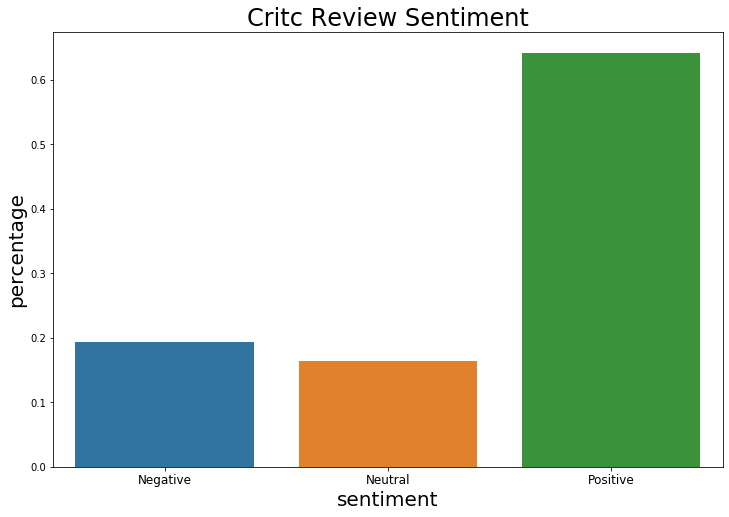

In [9]:
plt.figure(figsize=(12,8))
sns.barplot(df.sent_class.value_counts(normalize=True).index, 
            df.sent_class.value_counts(normalize=True).values)
plt.xlabel('sentiment', fontsize=20)
plt.ylabel('percentage', fontsize=20)
plt.title('Critc Review Sentiment', fontsize=24)
plt.xticks(ticks = [0, 1, 2], labels = ['Negative', 'Neutral', 'Positive'], fontsize=12)


In [11]:
top = ['Rock', 'Indie', 'Rap', 'Pop', 'Electronic']

In [12]:
df_top = df.loc[df['genre'].isin(top)]

In [13]:
df_top

,Unnamed: 0,title,artist,label,release_date,metascore,user_score,genre,summary,name,...,clean_review,length,word_count,sentiment,negative,neutral,positive,sent_class,rating_sent,sp_lm
8499,8494,Pyramid,Jaga Jazzist,Brainfeeder,2020-08-07,73.0,tbd,Electronic,The four-track album from the Norwegian ensemb...,Dusted Magazine,...,pyramid well worth scaling,90.0,5.0,0.4588,0.000,0.333,0.667,1.0,1.0,pyramid well worth scale
8500,8495,Pyramid,Jaga Jazzist,Brainfeeder,2020-08-07,73.0,tbd,Electronic,The four-track album from the Norwegian ensemb...,AllMusic,...,brainy elaborate jaga jazzists pyramid sound g...,280.0,35.0,0.6486,0.000,0.725,0.275,1.0,1.0,brainy elaborate jaga jazzists pyramid sound g...
8501,8496,Pyramid,Jaga Jazzist,Brainfeeder,2020-08-07,73.0,tbd,Electronic,The four-track album from the Norwegian ensemb...,Under The Radar,...,faint heart seems jaga jazzist move brainfeede...,252.0,37.0,0.6369,0.000,0.792,0.208,1.0,1.0,faint heart seem jaga jazzist move brainfeeder...
8502,8497,Pyramid,Jaga Jazzist,Brainfeeder,2020-08-07,73.0,tbd,Electronic,The four-track album from the Norwegian ensemb...,The Line of Best Fit,...,still offering glimmers jaga jazzist undefinab...,330.0,38.0,0.0000,0.000,1.000,0.000,0.0,1.0,still offer glimmer jaga jazzist undefinable f...
8503,8498,Pyramid,Jaga Jazzist,Brainfeeder,2020-08-07,73.0,tbd,Electronic,The four-track album from the Norwegian ensemb...,Mojo,...,refining rather redefining jun p,109.0,7.0,0.0000,0.000,1.000,0.000,0.0,0.0,refine rather redefine jun p
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
110263,110203,Central Reservation,Beth Orton,Arista,1999-03-09,84.0,8.4,Rock,This is the second album for the English singe...,AllMusic,...,central reservation first foremost record hope...,320.0,43.0,0.4404,0.000,0.868,0.132,1.0,1.0,central reservation first foremost record hope...
110264,110204,Central Reservation,Beth Orton,Arista,1999-03-09,84.0,8.4,Rock,This is the second album for the English singe...,Austin Chronicle,...,havent heard plaintive curiously uplifting lon...,263.0,35.0,-0.1531,0.248,0.619,0.133,-1.0,1.0,have not hear plaintive curiously uplifting lo...
110265,110205,Central Reservation,Beth Orton,Arista,1999-03-09,84.0,8.4,Rock,This is the second album for the English singe...,CDNow,...,central reservation finds ortons unique husky ...,306.0,40.0,0.2023,0.130,0.714,0.155,1.0,1.0,central reservation find ortons unique husky v...
110266,110206,Central Reservation,Beth Orton,Arista,1999-03-09,84.0,8.4,Rock,This is the second album for the English singe...,Armchair DJ,...,central reservation decidedly grownup pleasure...,187.0,20.0,0.8828,0.000,0.438,0.562,1.0,0.0,central reservation decidedly grownup pleasure...


Text(0.5, 1.0, 'Critic Sentiment Intensity for Most Reviewed Genres')

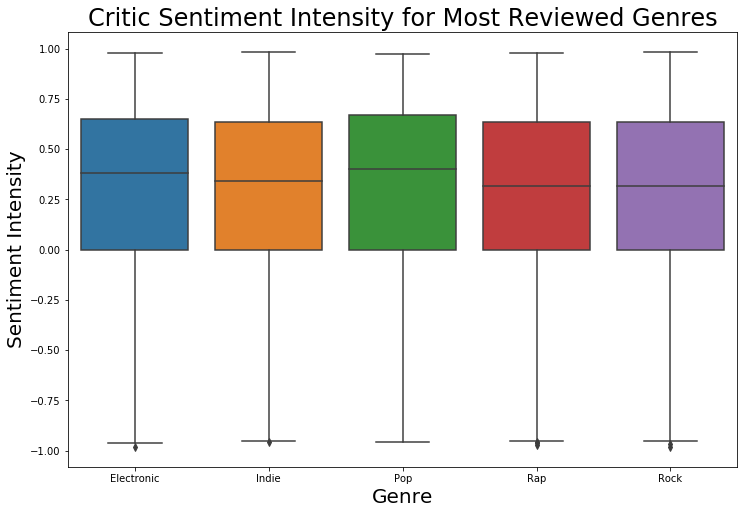

In [14]:
plt.figure(figsize=(12,8))
sns.boxplot(x = 'genre', y = 'sentiment', data = df_top)
plt.xlabel('Genre', fontsize=20)
plt.ylabel('Sentiment Intensity', fontsize=20)
plt.title('Critic Sentiment Intensity for Most Reviewed Genres', fontsize=24)


In [90]:
df.rating.describe()

count    110836.000000
mean         70.944874
std          14.551320
min           0.000000
25%          60.000000
50%          72.000000
75%          80.000000
max         100.000000
Name: rating, dtype: float64

(array([-20.,   0.,  20.,  40.,  60.,  80., 100., 120.]),
 <a list of 8 Text xticklabel objects>)

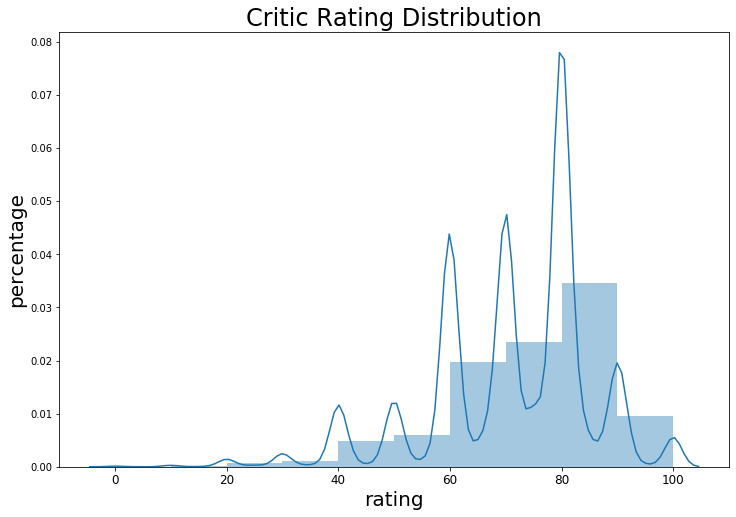

In [92]:
plt.figure(figsize=(12,8))
sns.distplot(df.rating, bins=10)
plt.xlabel('rating', fontsize=20)
plt.ylabel('percentage', fontsize=20)
plt.title('Critic Rating Distribution', fontsize=24)
plt.xticks(fontsize=12)

(array([-500.,    0.,  500., 1000., 1500., 2000., 2500.]),
 <a list of 7 Text xticklabel objects>)

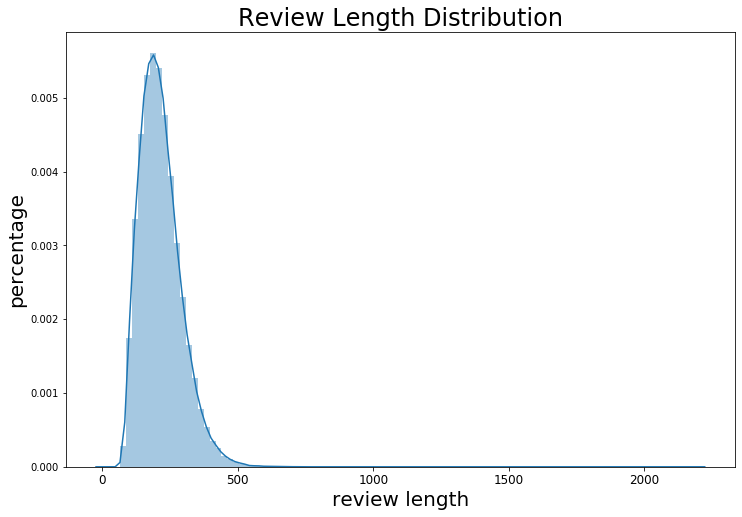

In [93]:
plt.figure(figsize=(12,8))
sns.distplot(df.length, bins=100)
plt.xlabel('review length', fontsize=20)
plt.ylabel('percentage', fontsize=20)
plt.title('Review Length Distribution', fontsize=24)
plt.xticks(fontsize=12)

(array([-50.,   0.,  50., 100., 150., 200., 250., 300., 350., 400.]),
 <a list of 10 Text xticklabel objects>)

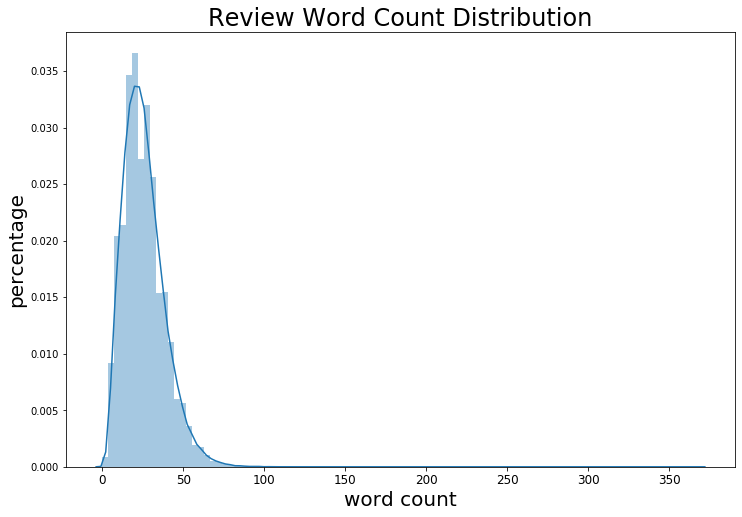

In [94]:
plt.figure(figsize=(12,8))
sns.distplot(df.word_count, bins=100)
plt.xlabel('word count', fontsize=20)
plt.ylabel('percentage', fontsize=20)
plt.title('Review Word Count Distribution', fontsize=24)
plt.xticks(fontsize=12)

In [24]:
tokenized_review = tokenizer.tokenize(df['clean_review'].sum())

In [25]:
rev_words = FreqDist(tokenized_review)

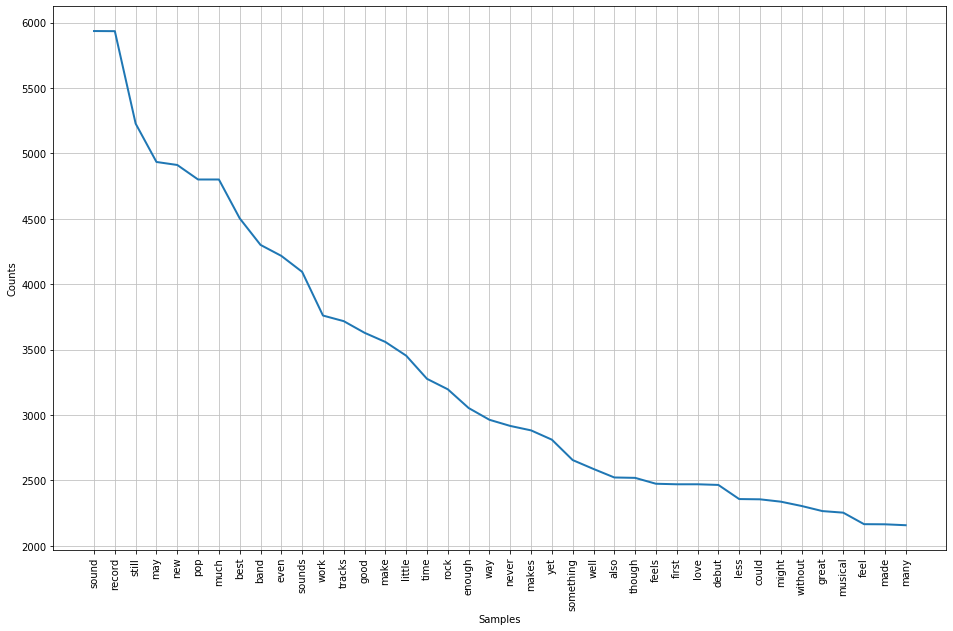

In [26]:
plt.figure(figsize=(16,10))
rev_words.plot(40)

### 3.3 Bigrams and Trigrams for each class

In [95]:
def get_top_text_ngrams(corpus, n, g):
    vec = CountVectorizer(ngram_range = (g, g), stop_words=stopwords_list).fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis = 0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq = sorted(words_freq, key = lambda x: x[1], reverse = True)
    return words_freq[:n]

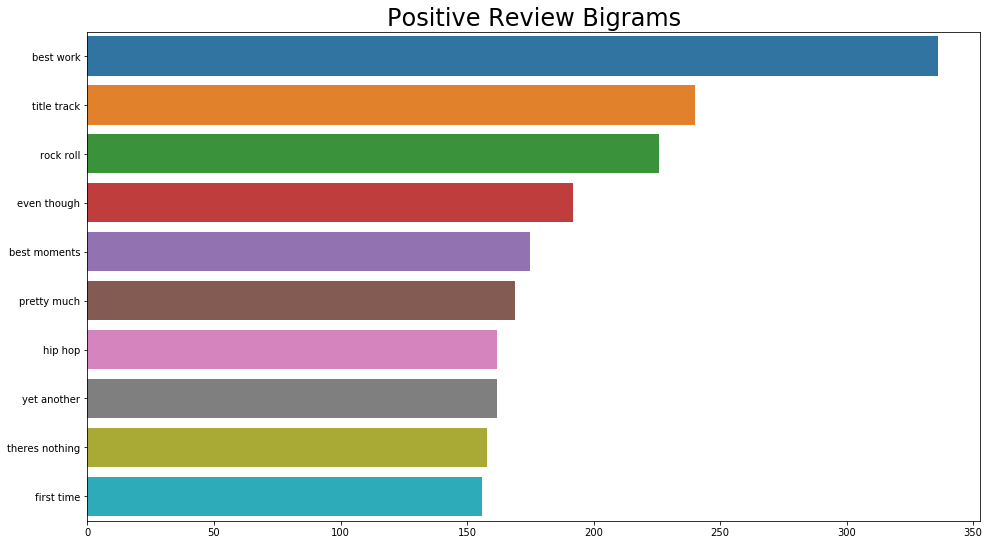

In [96]:
plt.figure(figsize = (16, 9))
top_bigrams = get_top_text_ngrams(df[df.sent_class == 1].clean_review, 10, 2)
top_bigrams = dict(top_bigrams)
sns.barplot(x = list(top_bigrams.values()), y = list(top_bigrams.keys()))
plt.title('Positive Review Bigrams', fontsize=24)


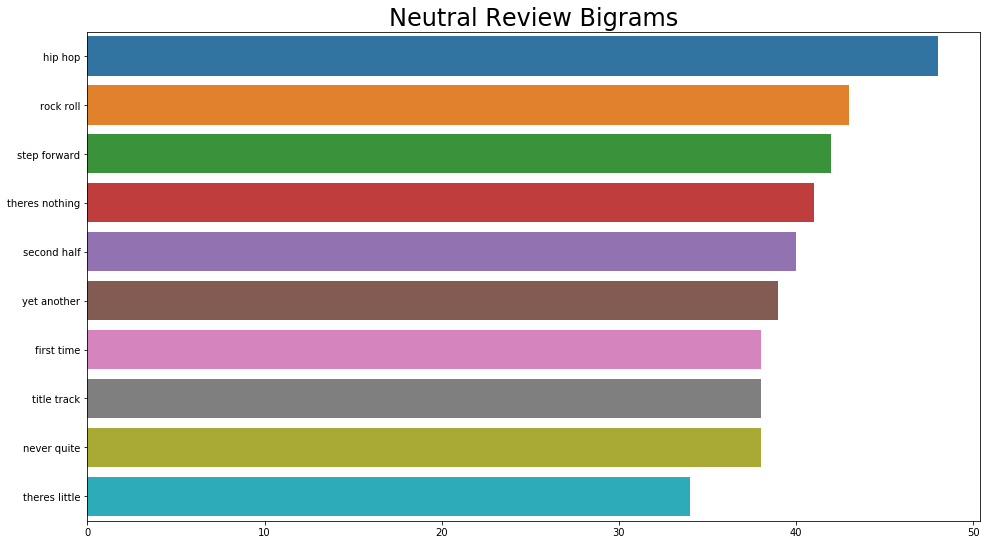

In [97]:
plt.figure(figsize = (16, 9))
top_bigrams = get_top_text_ngrams(df[df.sent_class == 0].clean_review, 10, 2)
top_bigrams = dict(top_bigrams)
sns.barplot(x = list(top_bigrams.values()), y = list(top_bigrams.keys()))
plt.title('Neutral Review Bigrams', fontsize=24)


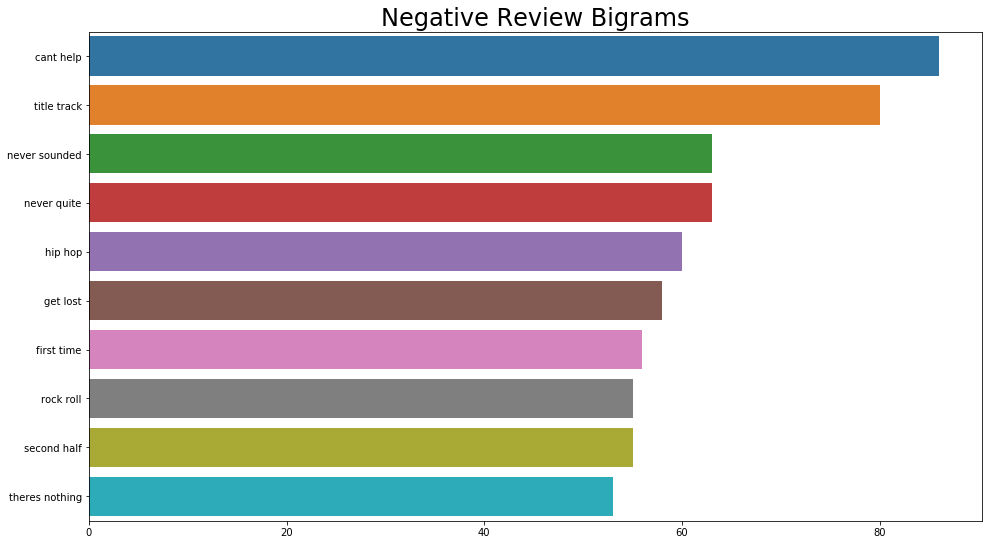

In [98]:
plt.figure(figsize = (16, 9))
top_bigrams = get_top_text_ngrams(df[df.sent_class == -1].clean_review, 10, 2)
top_bigrams = dict(top_bigrams)
sns.barplot(x = list(top_bigrams.values()), y = list(top_bigrams.keys()))
plt.title('Negative Review Bigrams', fontsize=24)


Trigrams

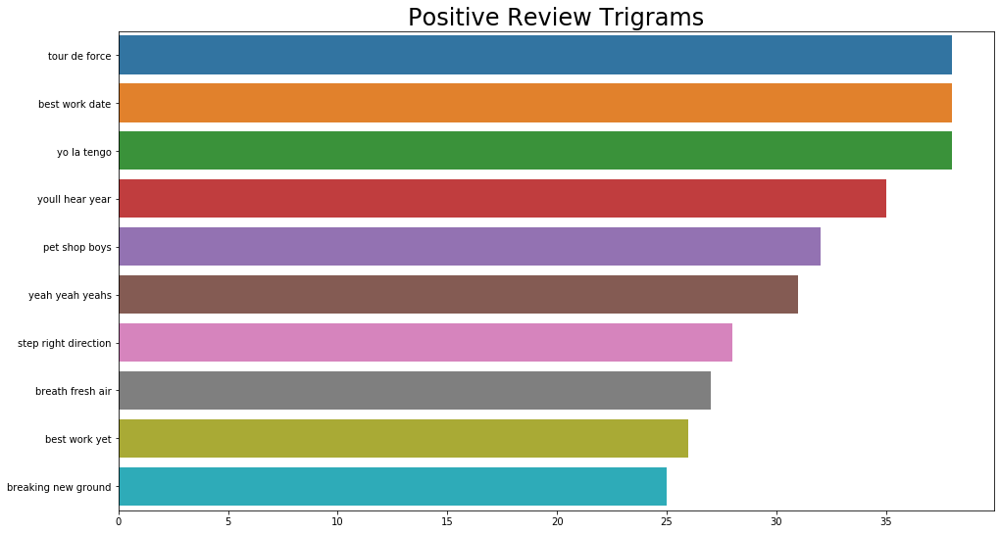

In [99]:
plt.figure(figsize = (16, 9))
top_trigrams = get_top_text_ngrams(df[df.sent_class == 1].clean_review, 10, 3)
top_trigrams = dict(top_trigrams)
sns.barplot(x = list(top_trigrams.values()), y = list(top_trigrams.keys()))
plt.title('Positive Review Trigrams', fontsize=24)


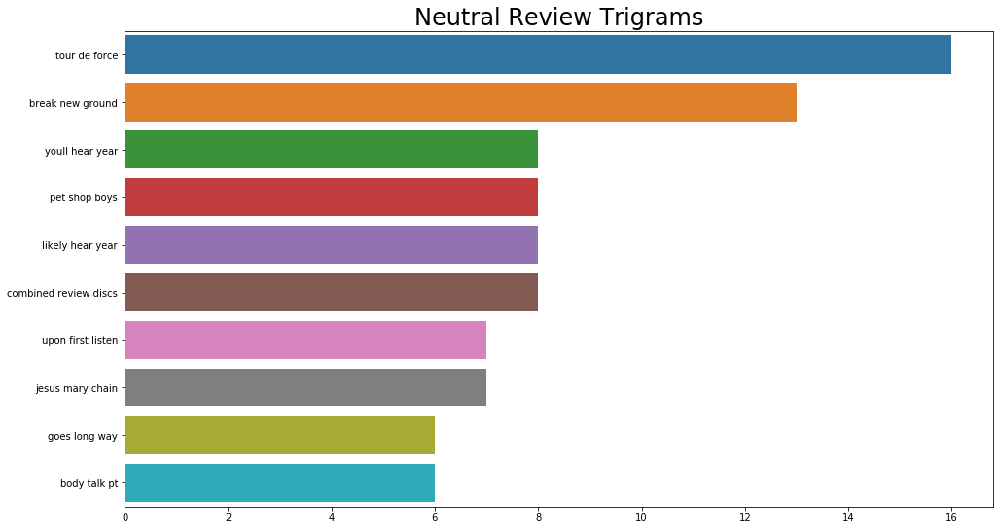

In [100]:
plt.figure(figsize = (16, 9))
top_trigrams = get_top_text_ngrams(df[df.sent_class == 0].clean_review, 10, 3)
top_trigrams = dict(top_trigrams)
sns.barplot(x = list(top_trigrams.values()), y = list(top_trigrams.keys()))
plt.title('Neutral Review Trigrams', fontsize=24)


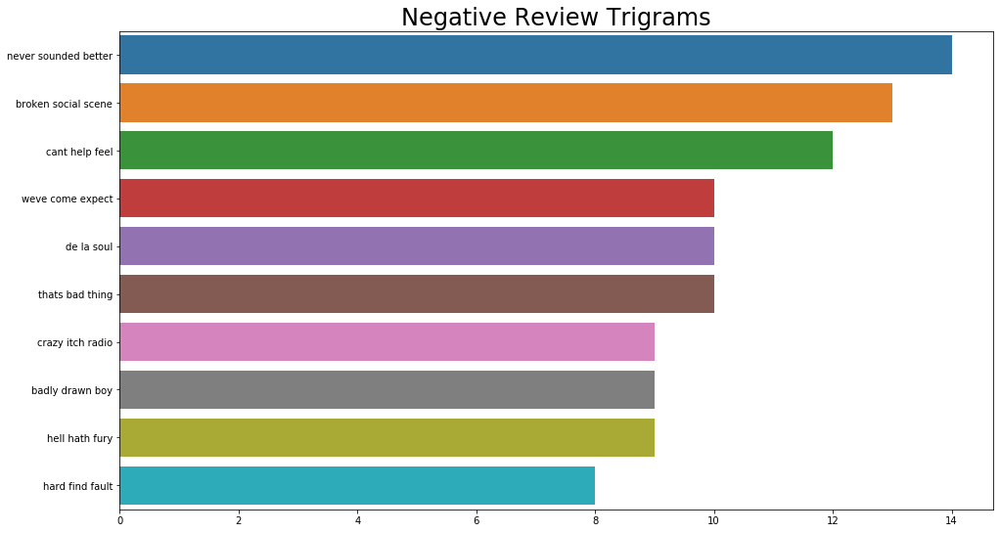

In [101]:
plt.figure(figsize = (16, 9))
top_bigrams = get_top_text_ngrams(df[df.sent_class == -1].clean_review, 10, 3)
top_bigrams = dict(top_bigrams)
sns.barplot(x = list(top_bigrams.values()), y = list(top_bigrams.keys()))
plt.title('Negative Review Trigrams', fontsize=24)


### 3.4 Word Cloud for each class

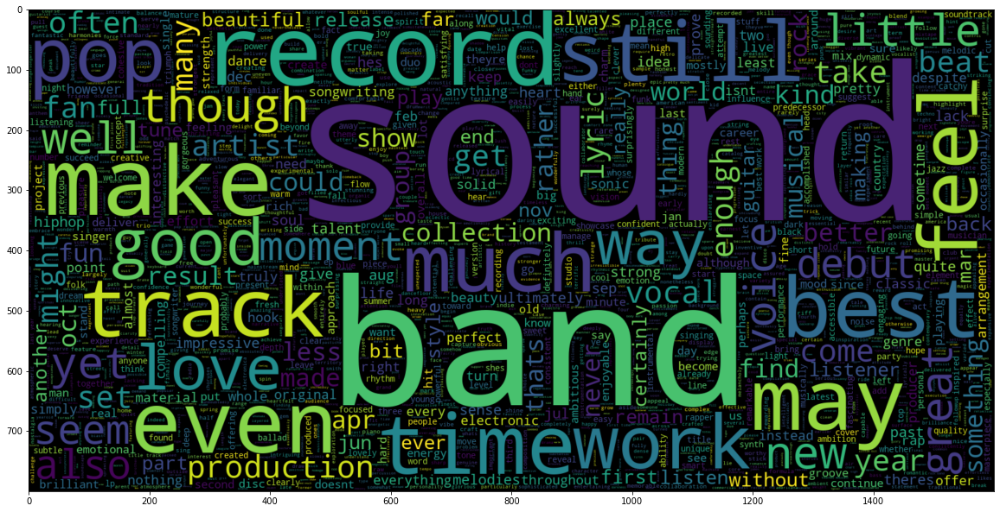

In [102]:
plt.figure(figsize = (20,20)) # Text that is True
wc = WordCloud(max_words = 2000 , width = 1600 , height = 800 , stopwords = stopwords_list).generate(" ".join(df[df.sent_class == 1].clean_review))
plt.imshow(wc , interpolation = 'bilinear')


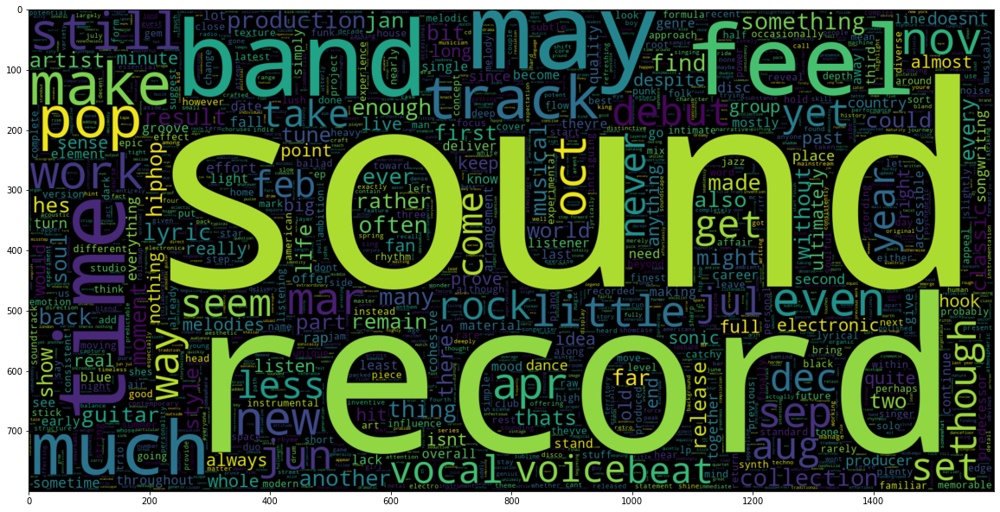

In [103]:
plt.figure(figsize = (20,20)) # Text that is True
wc = WordCloud(max_words = 2000 , width = 1600 , height = 800 , stopwords = stopwords_list).generate(" ".join(df[df.sent_class == 0].clean_review))
plt.imshow(wc , interpolation = 'bilinear')


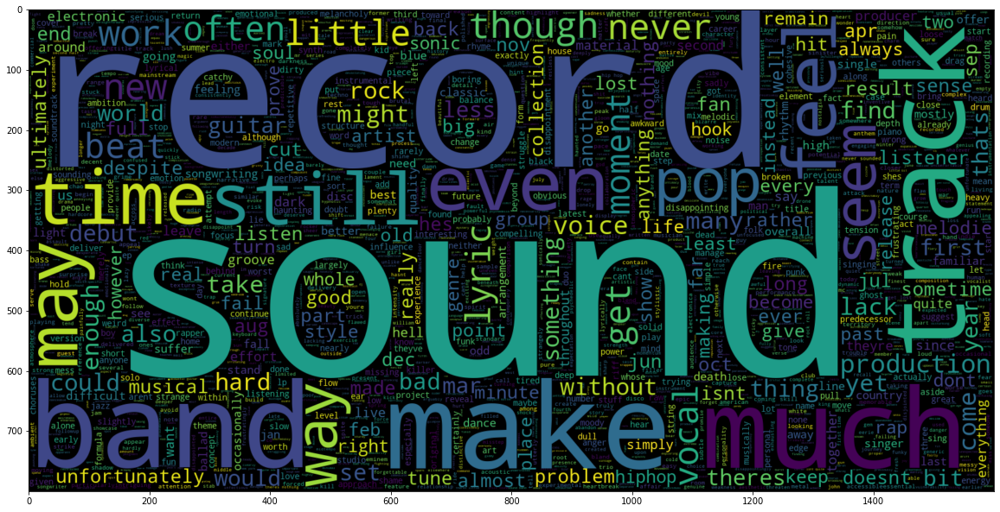

In [104]:
plt.figure(figsize = (20,20)) # Text that is True
wc = WordCloud(max_words = 2000 , width = 1600 , height = 800 , stopwords = stopwords_list).generate(" ".join(df[df.sent_class == -1].clean_review))
plt.imshow(wc , interpolation = 'bilinear')


### 3.5 Word Clouds for Rock and Rap

These two generes were chosen specifically as they are have the top 3 most reviews and greater differences in musicial style compared to Rock vs Indie

Rock

In [105]:
df_rock = df.loc[df.genre == 'Rock']

/Users/danielmocombe/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


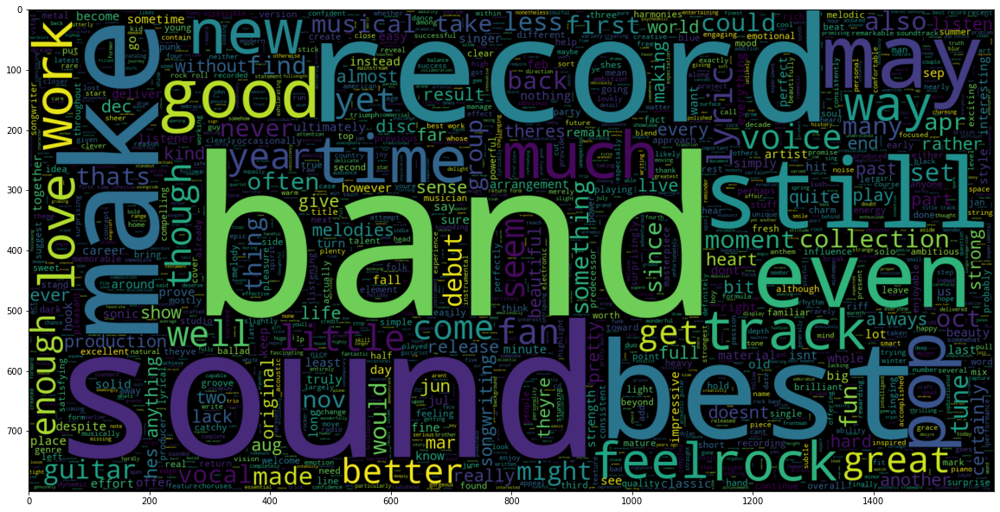

In [106]:
plt.figure(figsize = (20,20)) # Text that is True
wc = WordCloud(max_words = 2000 , width = 1600 , height = 800 , stopwords = stopwords_list).generate(" ".join(df_rock[df.sent_class == 1].clean_review))
plt.imshow(wc , interpolation = 'bilinear')


/Users/danielmocombe/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


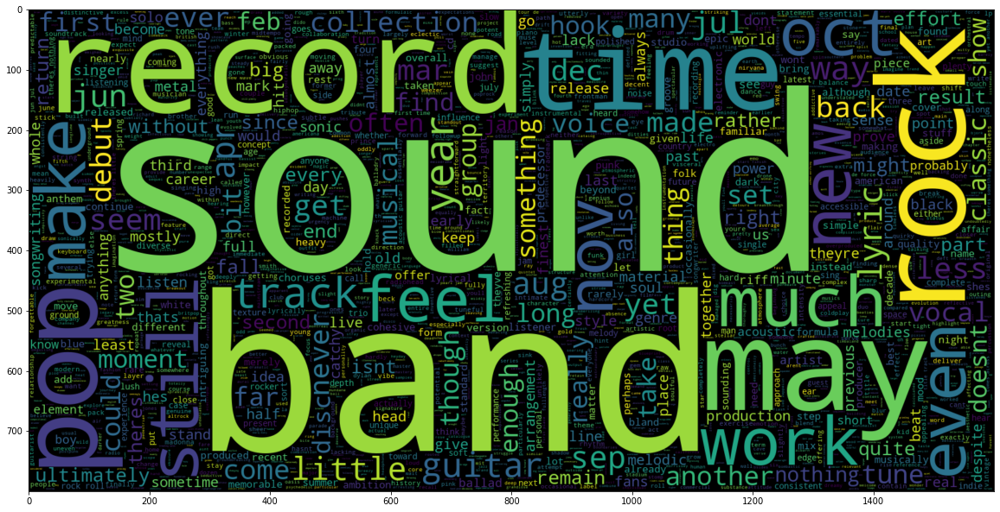

In [107]:
plt.figure(figsize = (20,20)) # Text that is True
wc = WordCloud(max_words = 2000 , width = 1600 , height = 800 , stopwords = stopwords_list).generate(" ".join(df_rock[df.sent_class == 0].clean_review))
plt.imshow(wc , interpolation = 'bilinear')


/Users/danielmocombe/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


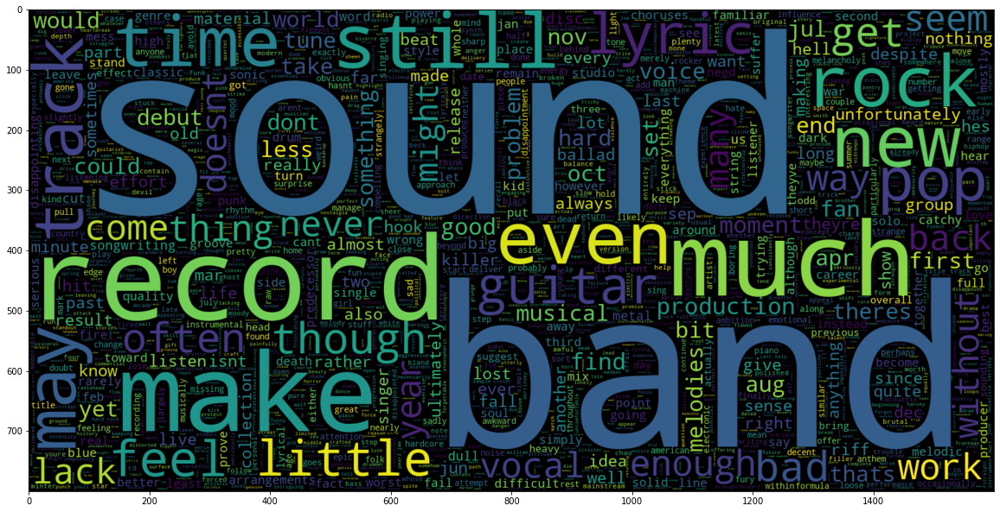

In [108]:
plt.figure(figsize = (20,20)) # Text that is True
wc = WordCloud(max_words = 2000 , width = 1600 , height = 800 , stopwords = stopwords_list).generate(" ".join(df_rock[df.sent_class == -1].clean_review))
plt.imshow(wc , interpolation = 'bilinear')


Rap

In [109]:
df_rap = df.loc[df.genre == 'Rap']

/Users/danielmocombe/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


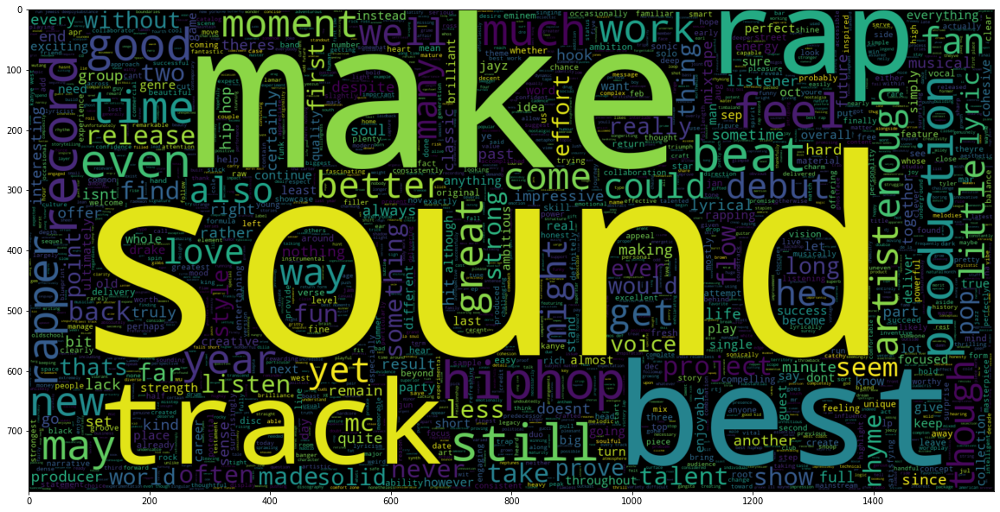

In [110]:
plt.figure(figsize = (20,20)) # Text that is True
wc = WordCloud(max_words = 2000 , width = 1600 , height = 800 , stopwords = stopwords_list).generate(" ".join(df_rap[df.sent_class == 1].clean_review))
plt.imshow(wc , interpolation = 'bilinear')


/Users/danielmocombe/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


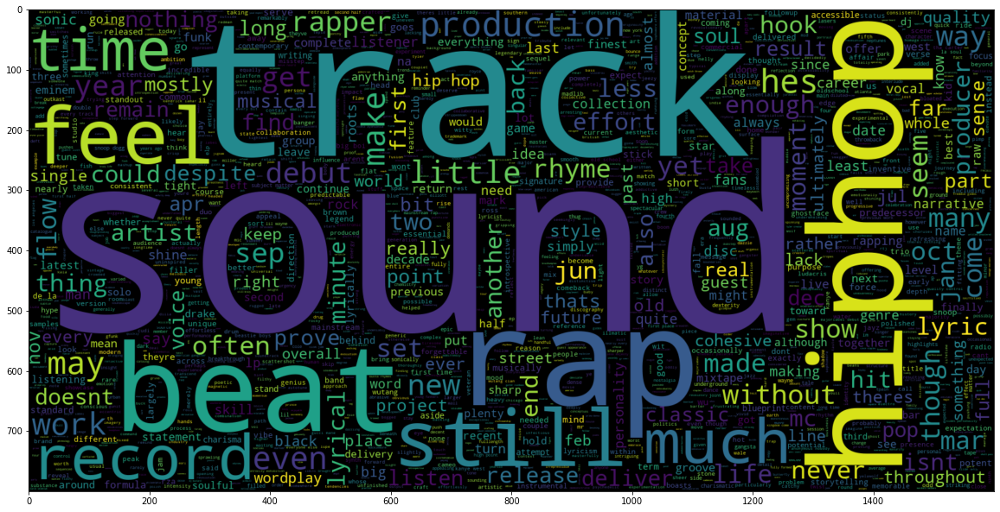

In [111]:
plt.figure(figsize = (20,20)) # Text that is True
wc = WordCloud(max_words = 2000 , width = 1600 , height = 800 , stopwords = stopwords_list).generate(" ".join(df_rap[df.sent_class == 0].clean_review))
plt.imshow(wc , interpolation = 'bilinear')


/Users/danielmocombe/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


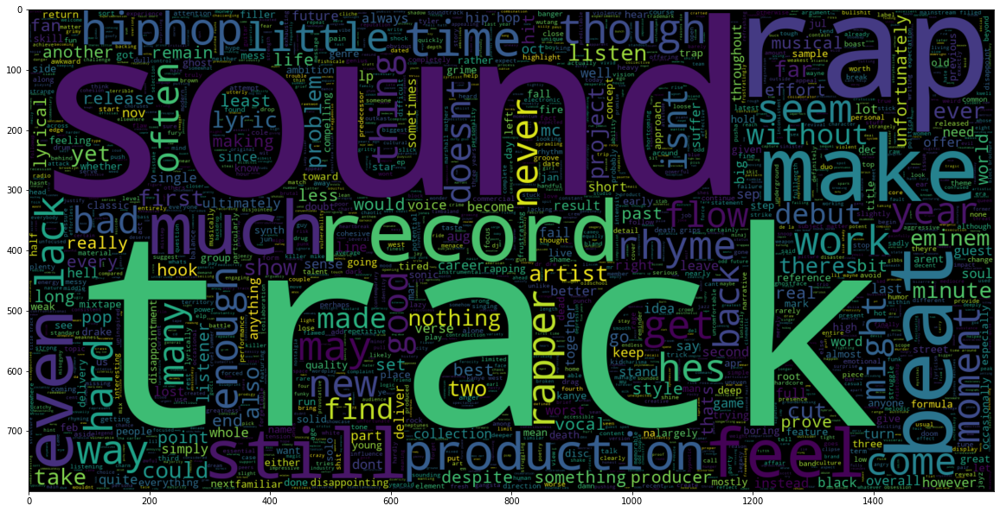

In [112]:
plt.figure(figsize = (20,20)) # Text that is True
wc = WordCloud(max_words = 2000 , width = 1600 , height = 800 , stopwords = stopwords_list).generate(" ".join(df_rap[df.sent_class == -1].clean_review))
plt.imshow(wc , interpolation = 'bilinear')
